## Import Packages

In [171]:
import uproot
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from matplotlib.colors import LinearSegmentedColormap

## Read Data

In [178]:
# Open the ROOT file
data_folder = "/home/yuema137/G4Projects/MIMICS/SPECT/data/"

file = uproot.open(f"{data_folder}/output_300.root")
tree = file["Hits"]

# Convert the entire tree to a pandas DataFrame
df = tree.arrays(library="pd")

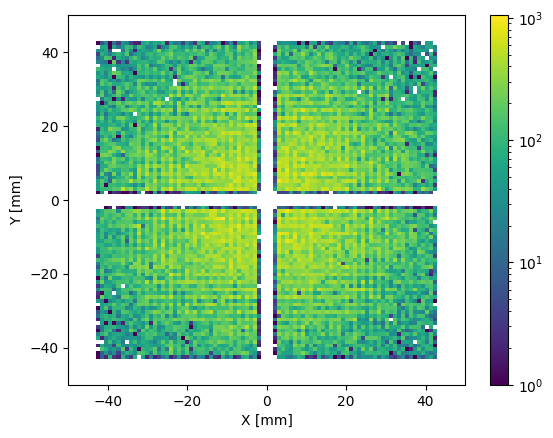

In [179]:
from matplotlib.colors import LogNorm
plt.hist2d(np.array(df["postStepX"]),np.array(df["postStepY"]),bins=(np.linspace(-50,50,100),np.linspace(-50,50,100)),norm=LogNorm())
plt.colorbar()
plt.xlabel("X [mm]")
plt.ylabel("Y [mm]")
plt.show()

In [189]:
np.unique(df["processName"])

array(['Rayl', 'Transportation', 'compt', 'eBrem', 'eIoni', 'msc', 'phot'],
      dtype=object)

In [ ]:
df["e_tot"] = df.groupby("eventID")["energyDeposit"].transform("sum")

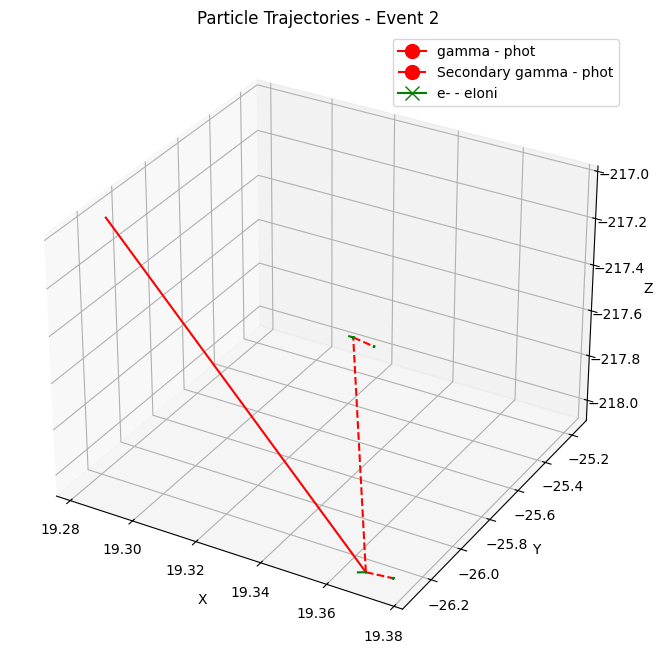

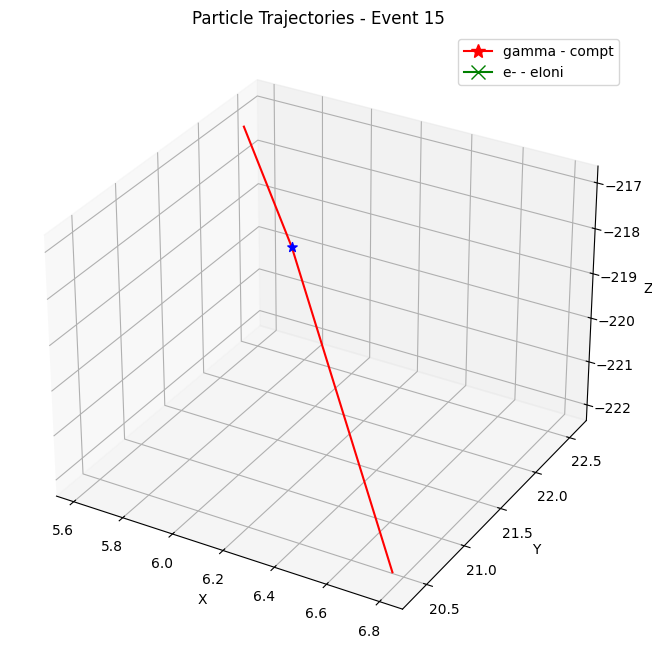

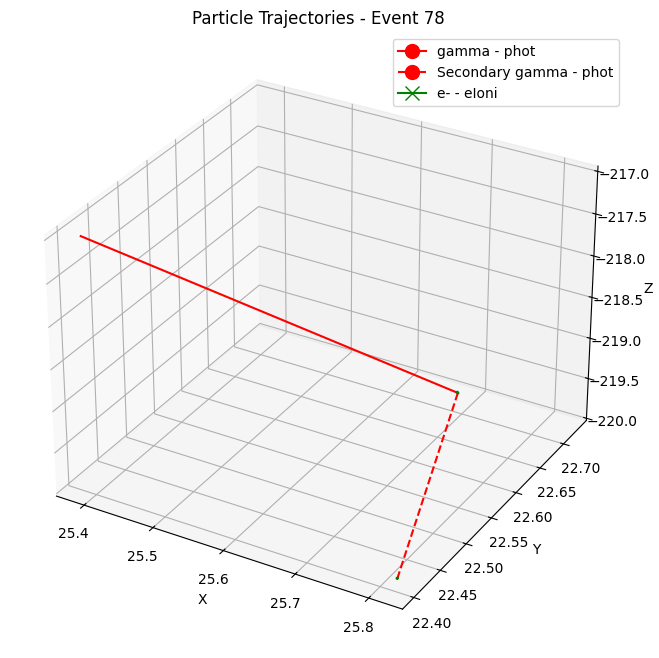

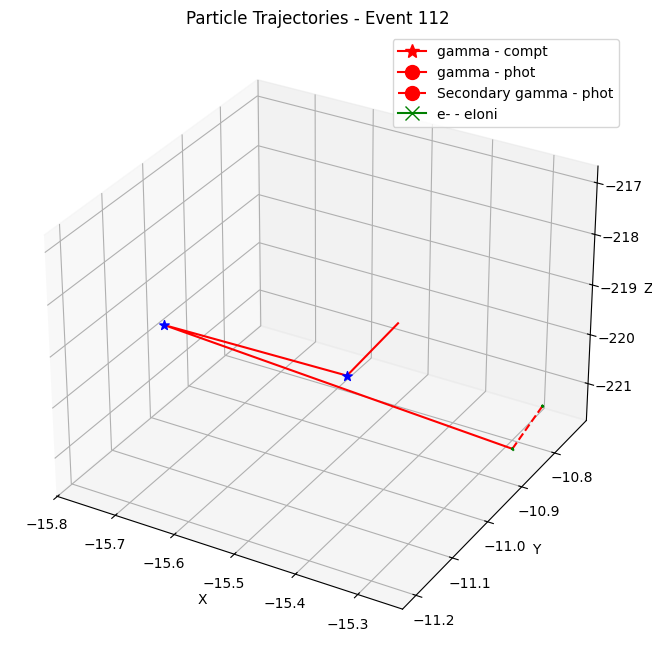

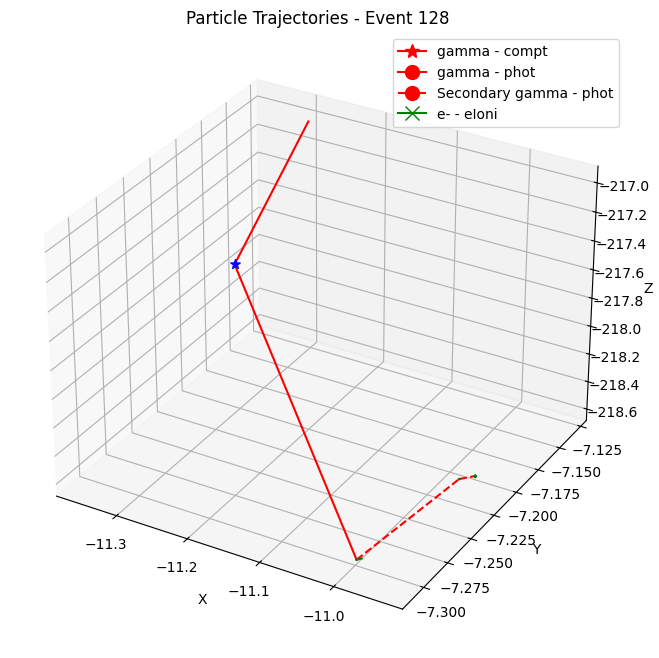

...

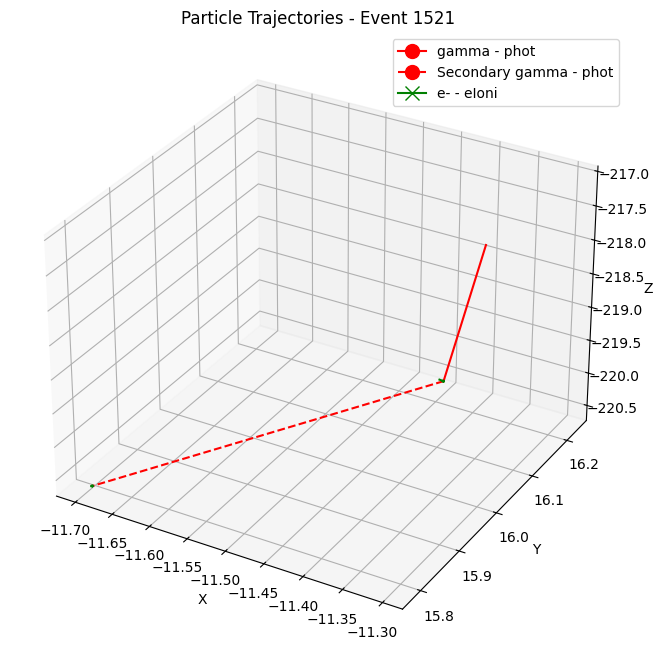

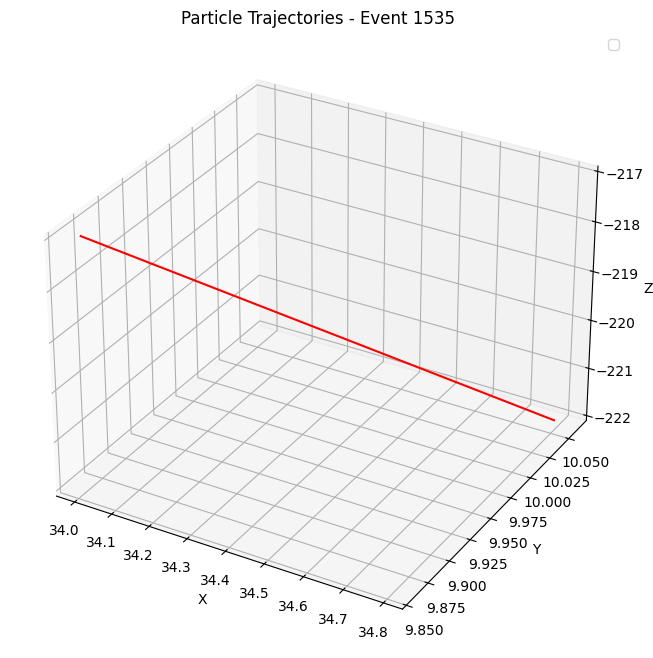

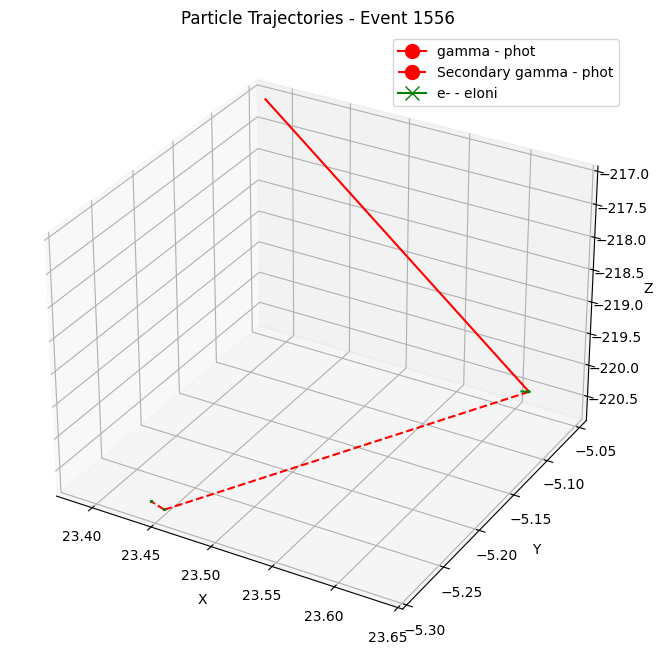

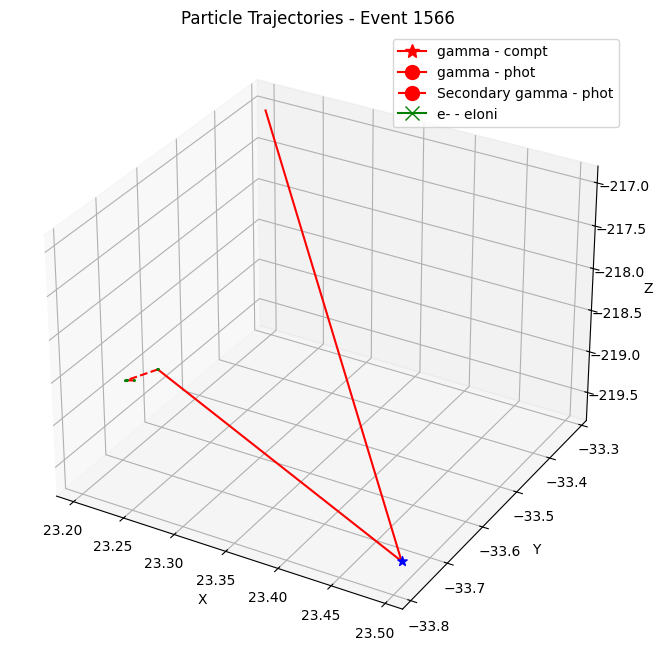

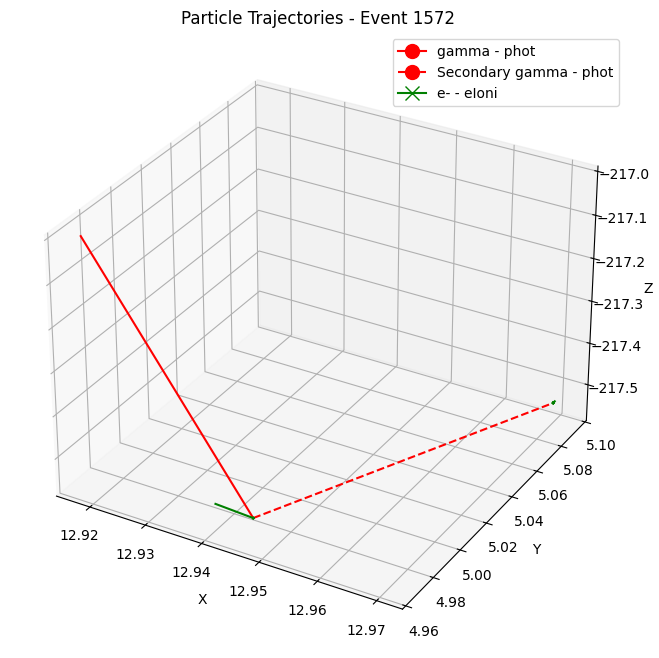

In [219]:
# Define color mapping
particle_colors = {
    'e-': 'green',
    'gamma': 'red'
}

# Define process markers
process_markers = {
    'compt': '*',  # star for Compton
    'phot': 'o'    # circle for photoabsorption
}

# Function to plot a single event
def plot_event(event_df, event_id):
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    legend_elements = []

    for particle in event_df['particleName'].unique():
        particle_df = event_df[event_df['particleName'] == particle]
        color = particle_colors.get(particle, 'gray')  # Default to gray if particle not in mapping
        
        for track in particle_df['trackID'].unique():
            track_df = particle_df[particle_df['trackID'] == track]
            
            x = np.concatenate([track_df['preStepX'], track_df['postStepX'].iloc[-1:]])
            y = np.concatenate([track_df['preStepY'], track_df['postStepY'].iloc[-1:]])
            z = np.concatenate([track_df['preStepZ'], track_df['postStepZ'].iloc[-1:]])
            
            # Check if it's a secondary gamma
            is_secondary_gamma = (particle == 'gamma' and 
                                  track_df['parentParticleName'].iloc[0] == 'gamma')
            
            linestyle = '--' if is_secondary_gamma else '-'
            ax.plot(x, y, z, color=color, linestyle=linestyle)
            
            # Plot energy deposits
            for _, step in track_df.iterrows():
                if step['energyDeposit'] > 0 or step["processName"] == "compt":
                    marker = process_markers.get(step['processName'], 'x')  # Default to 'x' if process not in mapping
                    if step["processName"] == "compt":
                        ax.scatter(step['postStepX'], step['postStepY'], step['postStepZ'], 
                                color="blue", marker=marker, s=50)
                    
                    # Add combined particle-process to legend elements if not already there
                    legend_key = f"{particle} - {step['processName']}"
                    if is_secondary_gamma:
                        legend_key = f"Secondary {legend_key}"
                    if legend_key not in [le.get_label() for le in legend_elements]:
                        legend_elements.append(Line2D([0], [0], color=color, marker=marker, 
                                                      linestyle=linestyle, markersize=10, label=legend_key))

    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title(f'Particle Trajectories - Event {event_id}')
    
    # Add the legend
    ax.legend(handles=legend_elements)
    
    plt.show()

# Plot each event
for event_id in df['eventID'].unique():
    event_df = df[df['eventID'] == event_id]
    plot_event(event_df, event_id)

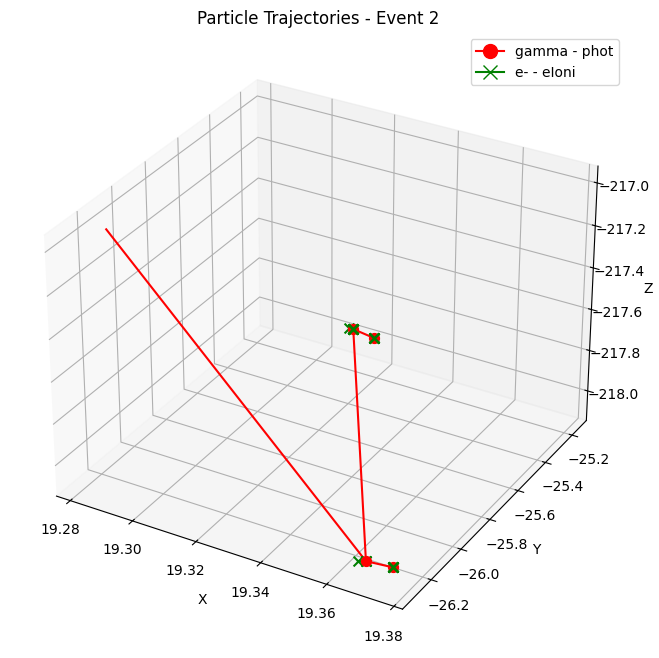

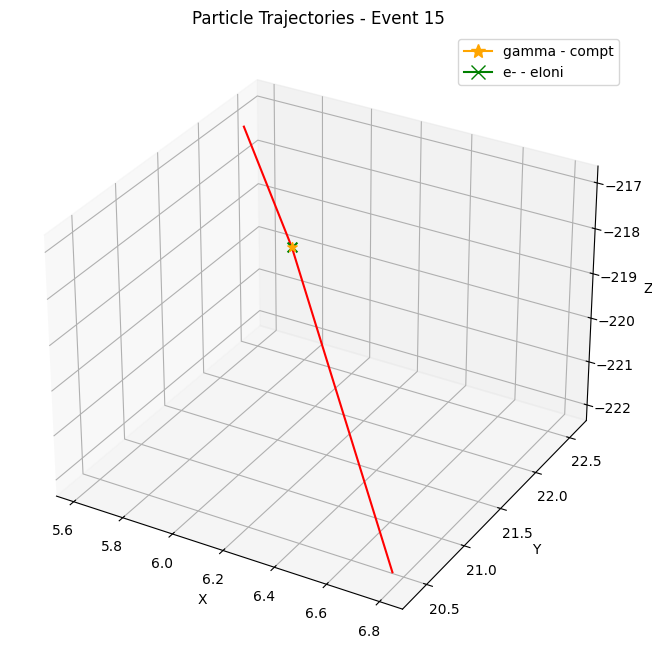

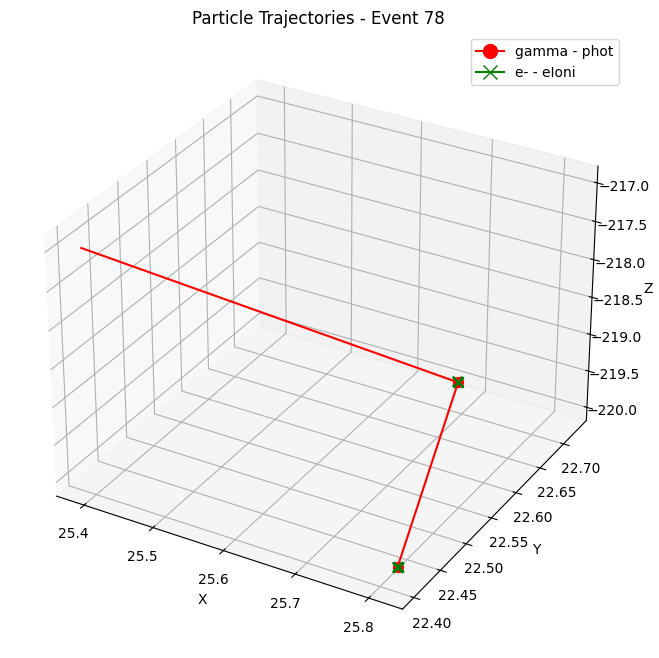

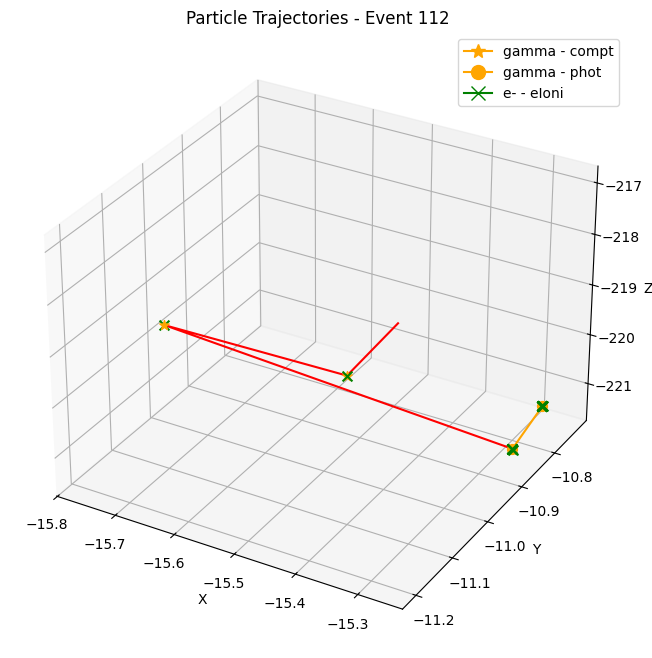

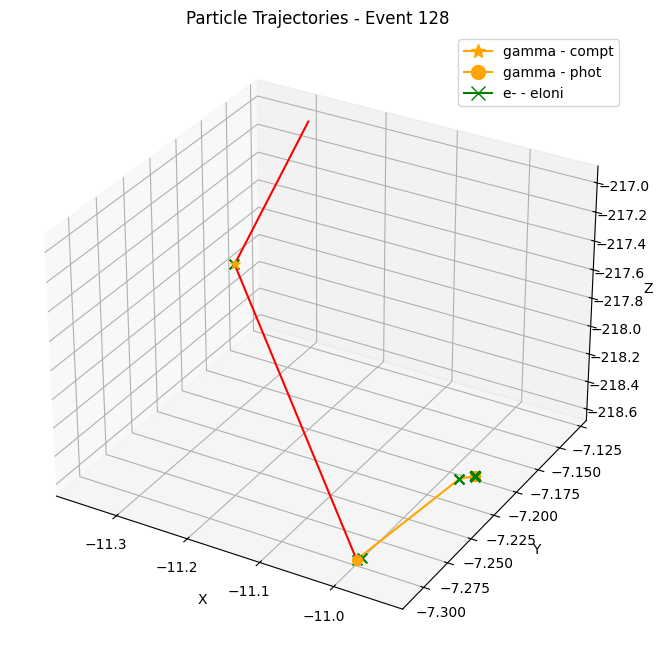

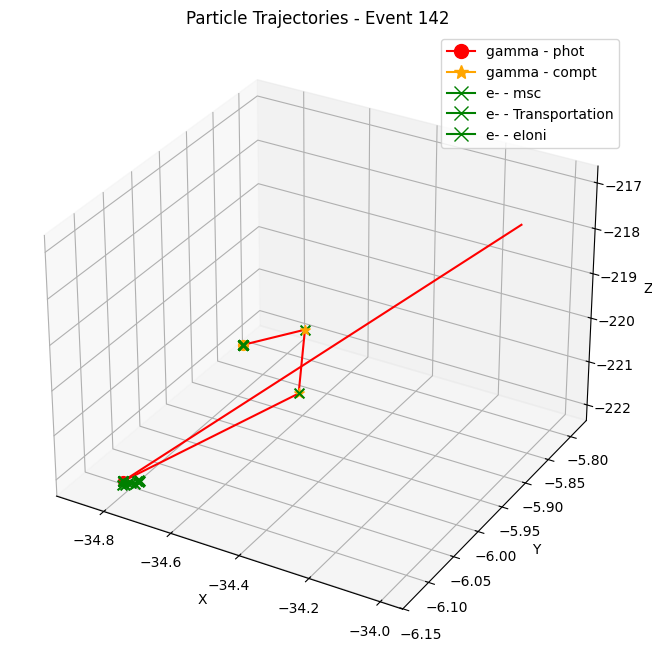

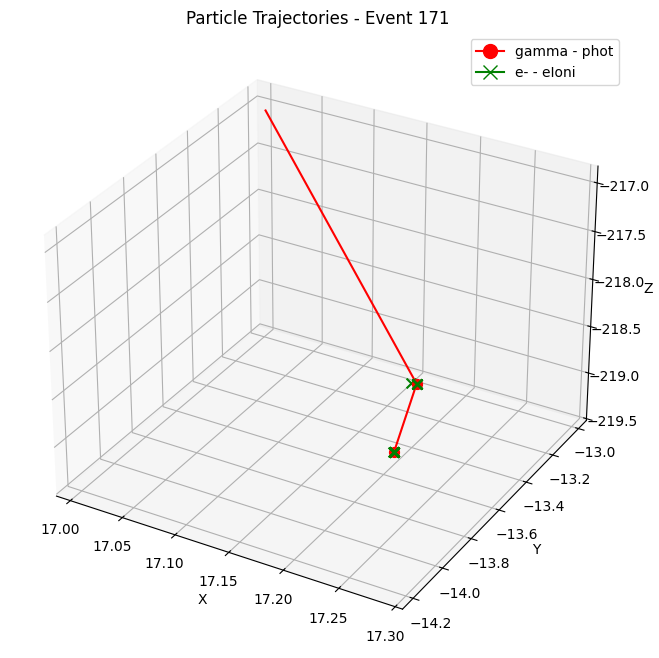

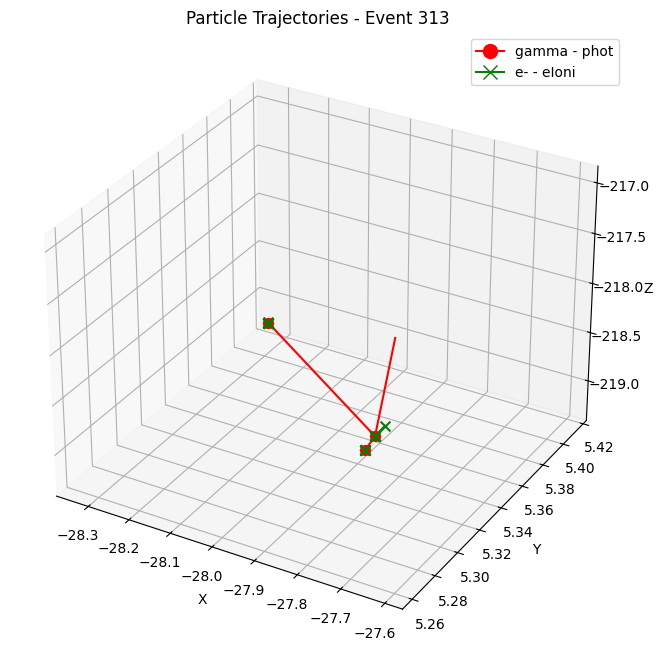

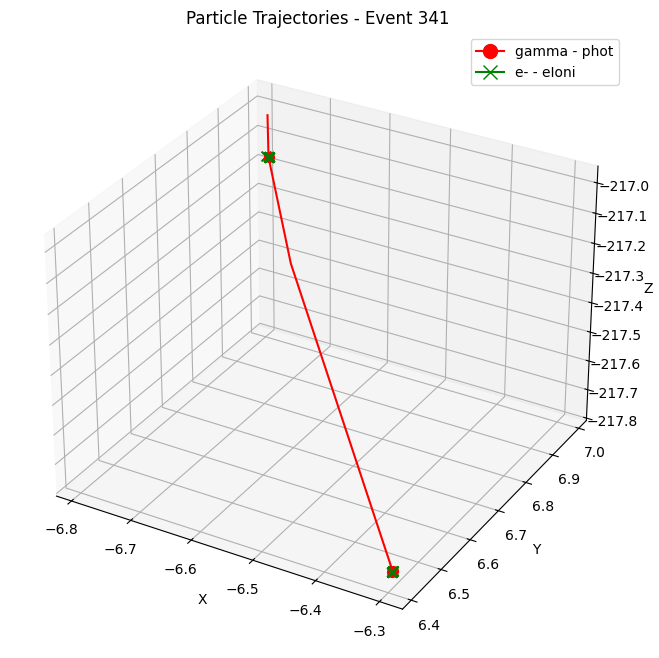

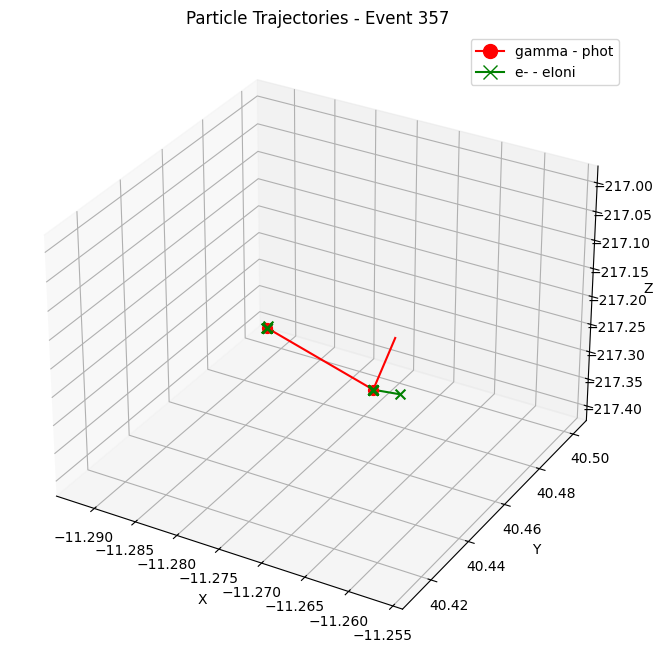

In [217]:
mask = df.e_tot > 0
selected_df = df[mask]
# Plot each event
for event_id in selected_df['eventID'].unique()[:10]:
    event_df = selected_df[selected_df['eventID'] == event_id]
    plot_event(event_df, event_id)